### OpenCV 기초
- 이미지 불러오기
- 이미지 크기 확인
- 이미지의 자료형
- 이미지 보기
- 비디오 재생(+웹캠)

In [2]:
import cv2

In [3]:
image_path = '../data/balloon.webp'
image = cv2.imread(image_path)

image.shape # 가로, 세로, 채널 수(BGR)

(1024, 1024, 3)

In [4]:
image.size # 이미지를 이루는 점의 개수
# image.shape[0]*image.shape[1]*image.shape[2]

3145728

In [5]:
image.dtype

dtype('uint8')

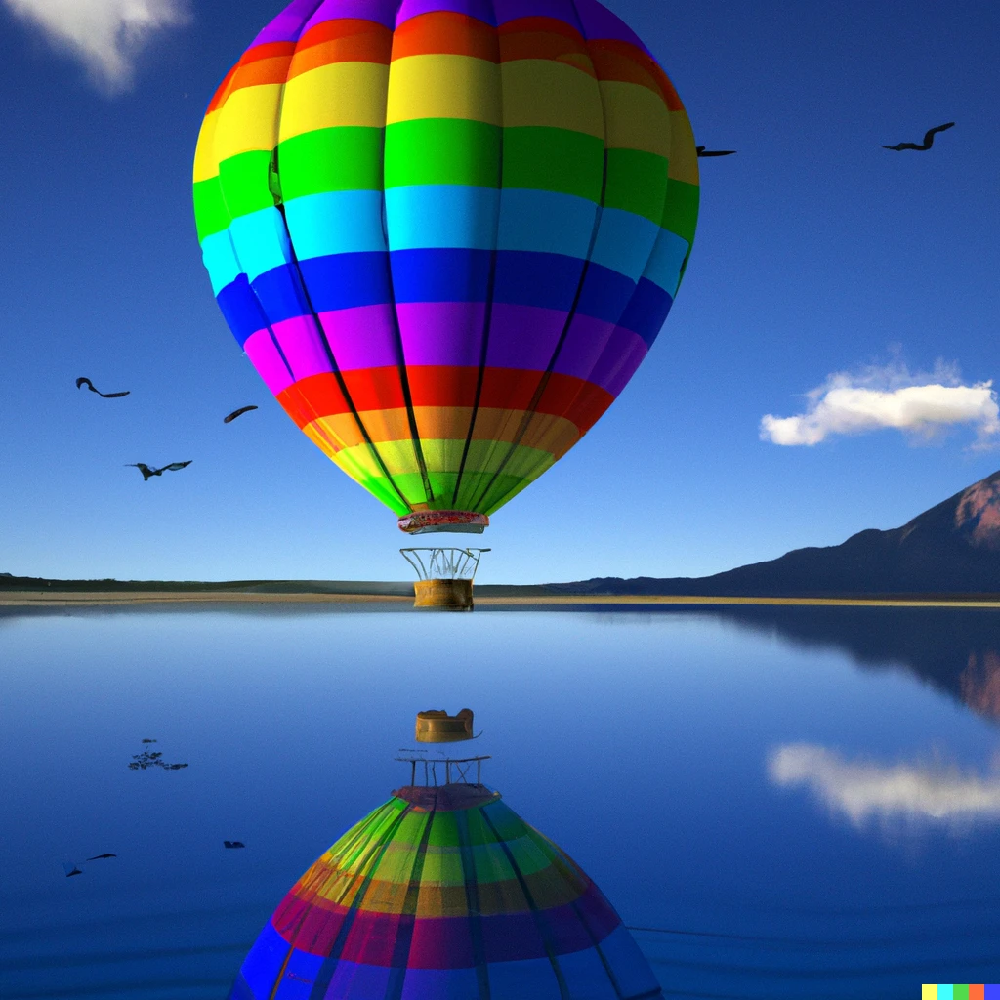

In [6]:
from PIL import Image

def show(image):
    rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return Image.fromarray(rgb)

show(image)

In [7]:
# pillow 이미지 -> numpy 배열

import numpy as np

pill_img = Image.open(image_path)
array = np.array(pill_img)
array = cv2.cvtColor(array, cv2.COLOR_RGB2BGR)

In [8]:
video = cv2.VideoCapture('../data/자전거.mp4')

fps = video.get(cv2.CAP_PROP_FPS) # 초당 프레임 수
frame_interval = int(1000/fps)    # 1프레임 간격(ms)

print(fps, frame_interval)

25.0 40


In [9]:
# 비디오 재생

while(video.isOpened()):
    ret, frame = video.read() # 한 프레임 읽기
    if not ret: break
    
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY) # 흑백으로 변환
    cv2.imshow('frame', gray)
    
    if cv2.waitKey(frame_interval) == ord('q'): # 키 입력 기다림
        break                                   # q가 입력되면 중단

video.release() # 파일 닫기
cv2.destroyAllWindows() # 창 닫기

In [10]:
# 웹캠 캡쳐

video = cv2.VideoCapture(0) # 카메라 준비

# 이미지 폭 640, 높이 480으로 설정
video.set(cv2.CAP_PROP_FRAME_WIDTH, 640)
video.set(cv2.CAP_PROP_FRAME_HEIGHT, 480)

while(video.isOpened()):
    ret, img = video.read() # 한 프레임 읽기
    if not ret: break
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # 흑백으로 변환
    cv2.imshow('frame', gray)
    
    if cv2.waitKey(frame_interval) == ord('q'): # 키 입력 기다림
        break                                   # q가 입력되면 중단

video.release() # 파일 닫기
cv2.destroyAllWindows() # 창 닫기

### 이미지 연산
- 덧셈 뺄셈 곱셈 나눗셈
- 컬러 스페이스

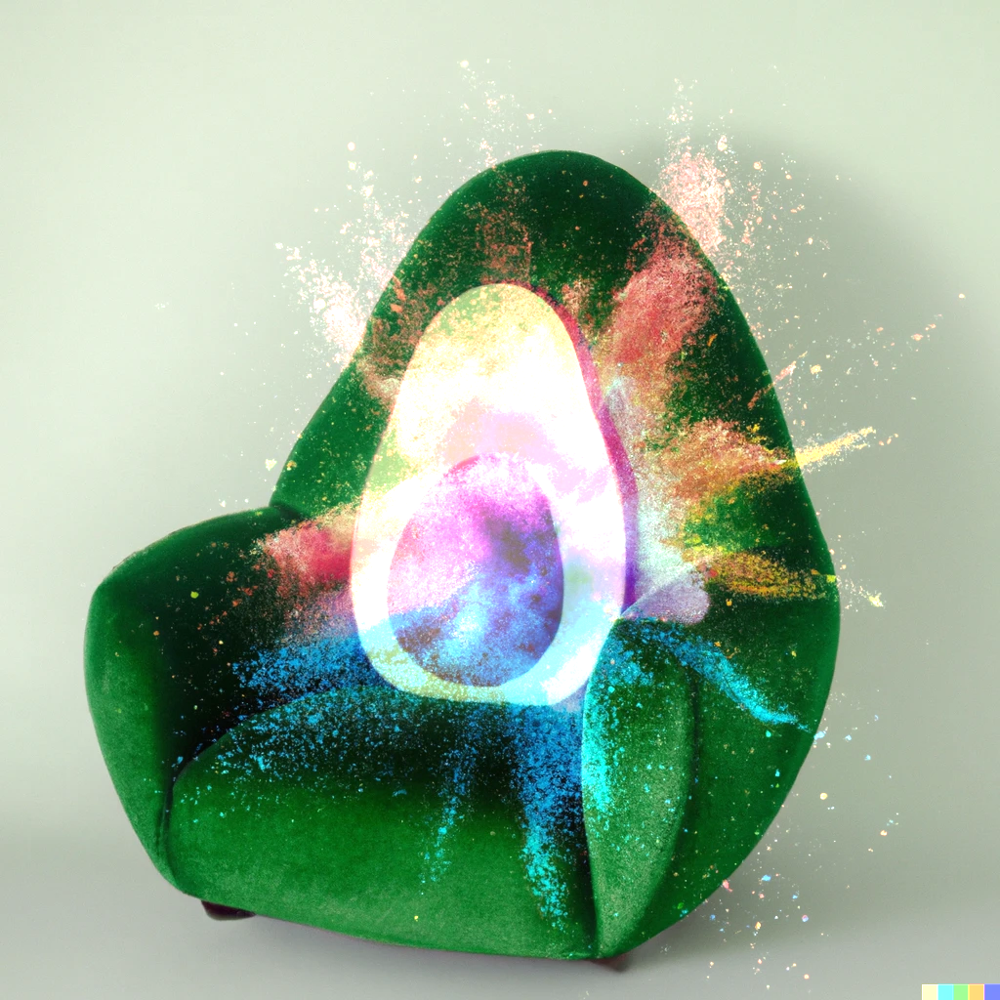

In [11]:
chair = cv2.imread("../data/chair.webp")
explosion = cv2.imread("../data/explosion.webp")

show(cv2.add(chair, explosion))

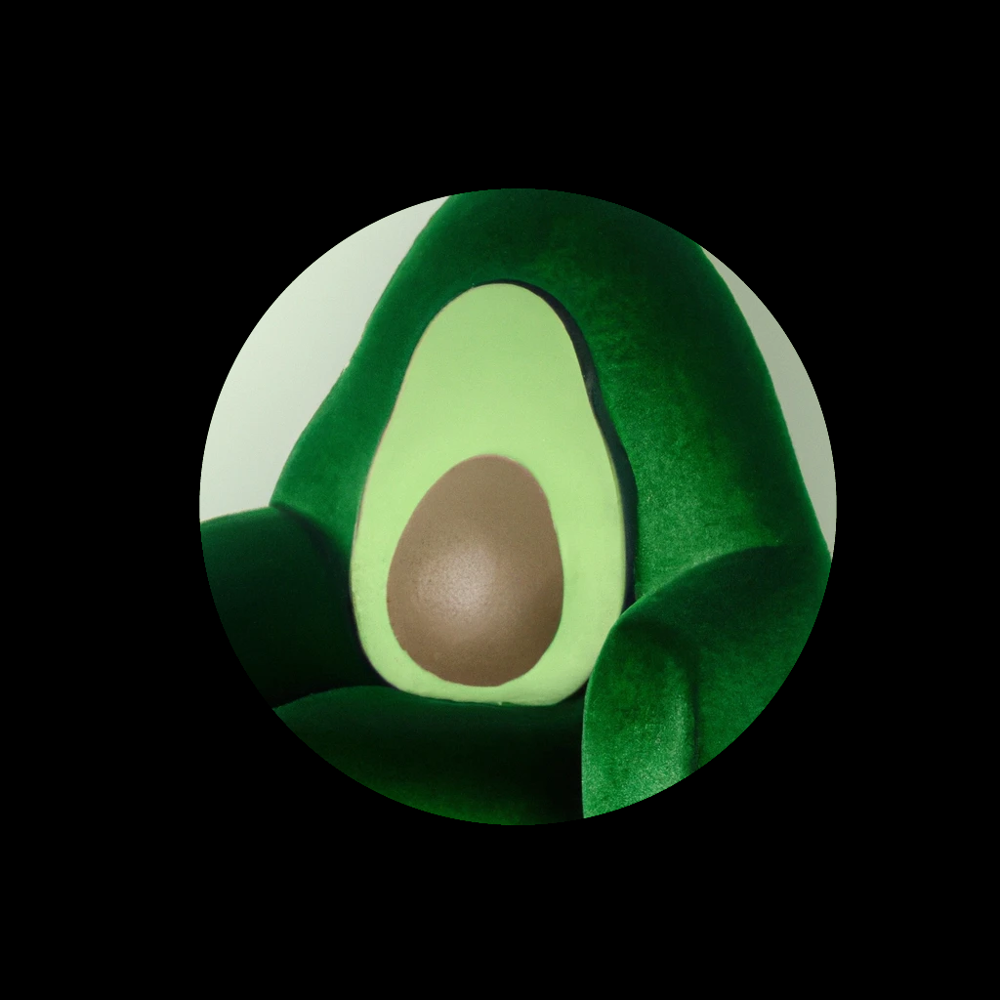

In [12]:
# 이미지 뺄셈
black_circle = cv2.imread('../data/black_circle.png')
show(cv2.subtract(chair, black_circle))

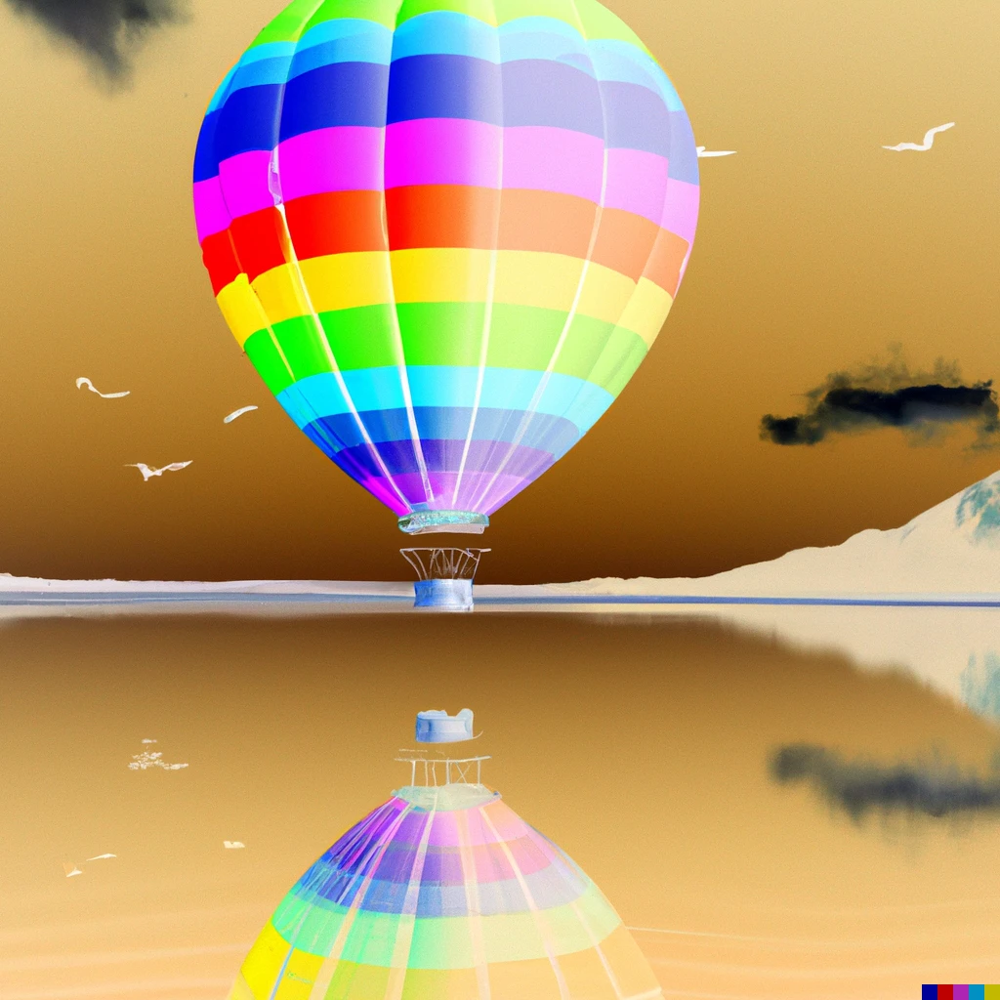

In [13]:
# 곱셈과 나눗셈

# 곱셈
# show(cv2.multiply(image, 3.0)) # 모든 픽셀의 밝기가 3배 밝아짐

# 나눗셈
# show(cv2.divide(image, 3.0)) # 모든 픽셀의 밝기가 1/3로 어두워짐

# 색 반전
show(255 - image)

In [14]:
# 컬러 스페이스

# 색을 표현하는 방법
# 1. RGB: Red(빨강), Green(초록), Blue(파랑)
# 2. HSV: Hue(색상 - 빨강, 파랑, 노랑 등), Saturation(채도), Value(명도)
# 3. Gray: 흑백

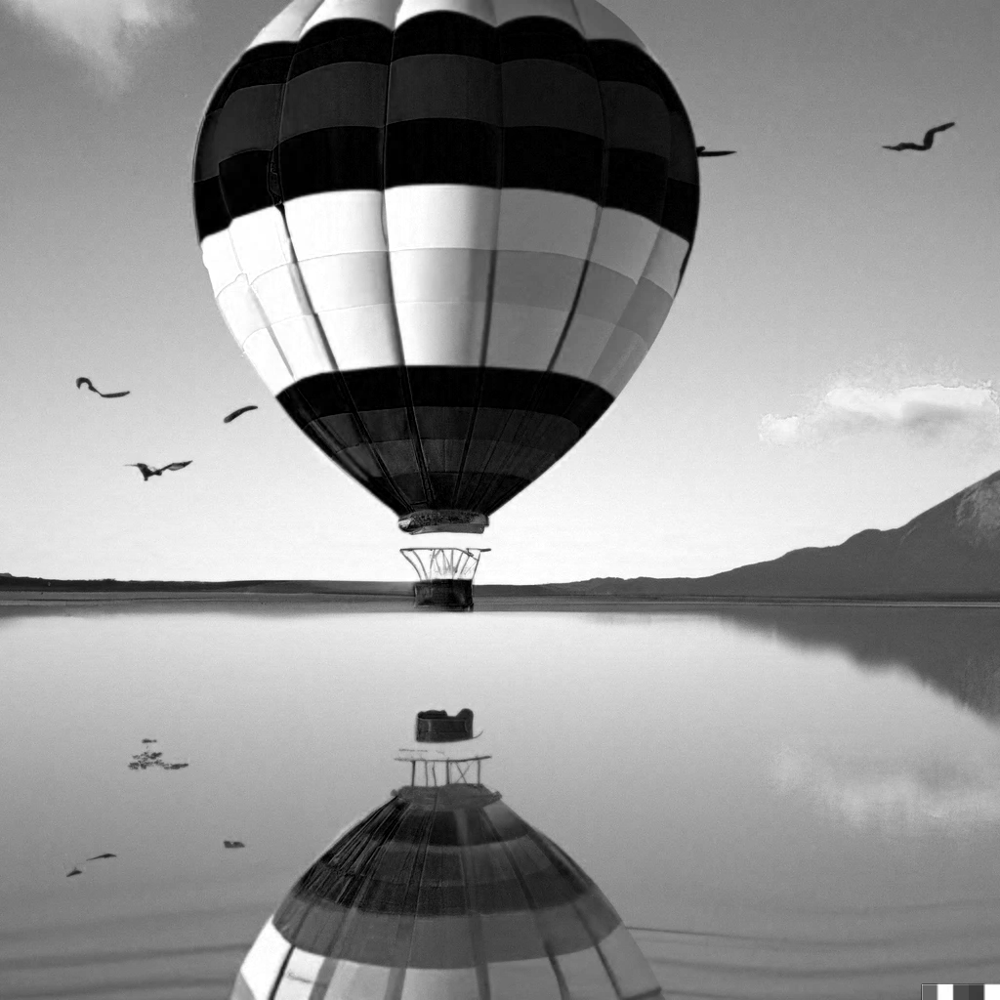

In [15]:
# 컬러 스페이스 바꾸기
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# 채널 분리
b, g, r = cv2.split(image)
show(b)

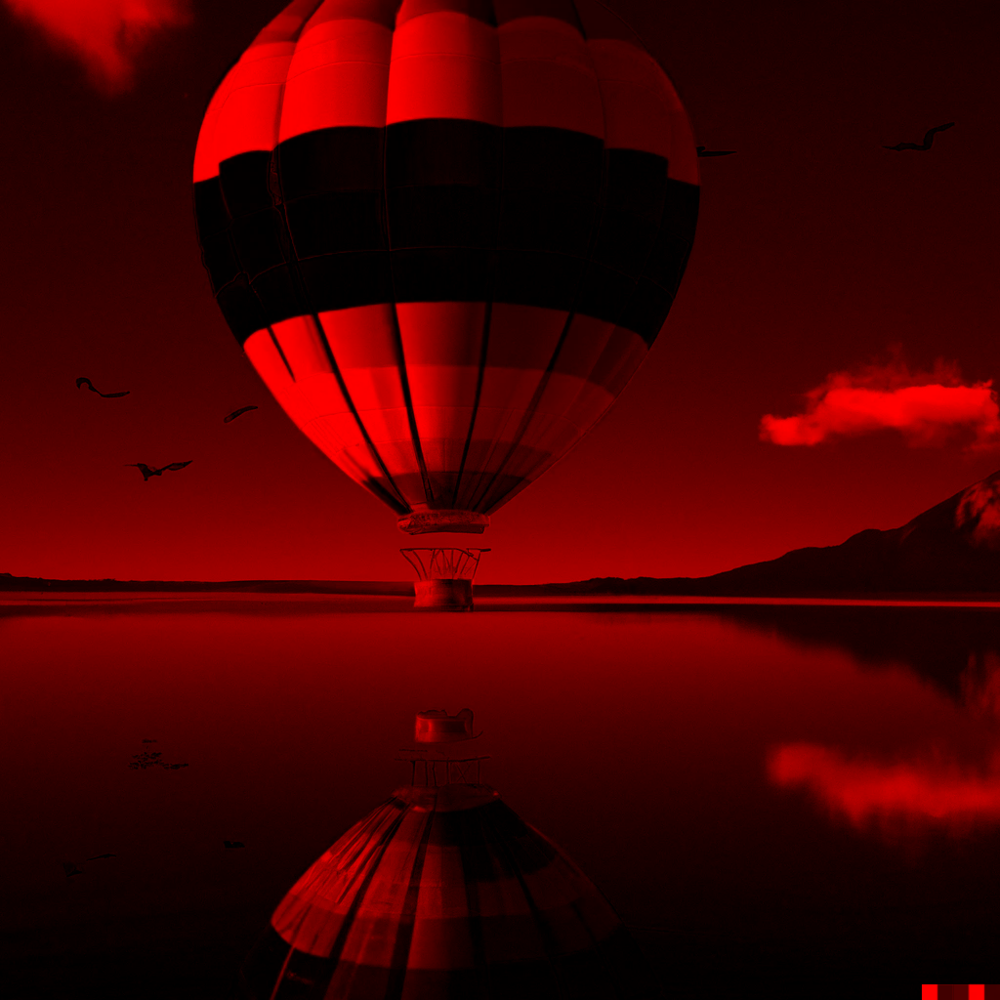

In [16]:
import numpy as np
z = np.zeros_like(b)
# show(cv2.merge((b, z, z))) # 파란색만 표시
# show(cv2.merge((z, g, z))) # 초록색만 표시
show(cv2.merge((z, z, r))) # 빨간색만 표시

### 색 보정
- 히스토그램을 이용한 이진화
- 오츠의 이진화 알고리즘
- Adaptive Thresholding
- Look-up Table을 이용한 색 변환
- 감마 보정

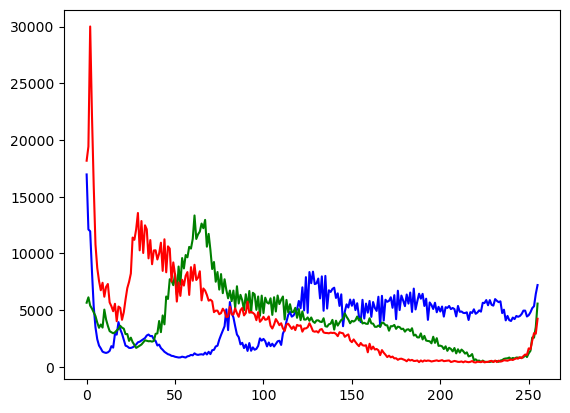

In [17]:
# 채널별 밝기의 분포 시각화
import matplotlib.pyplot as plt

for i, color in enumerate('bgr'):
    hist = cv2.calcHist([image], [i], mask=None, histSize=[256], ranges=[0, 256])
    plt.plot(hist, color=color)

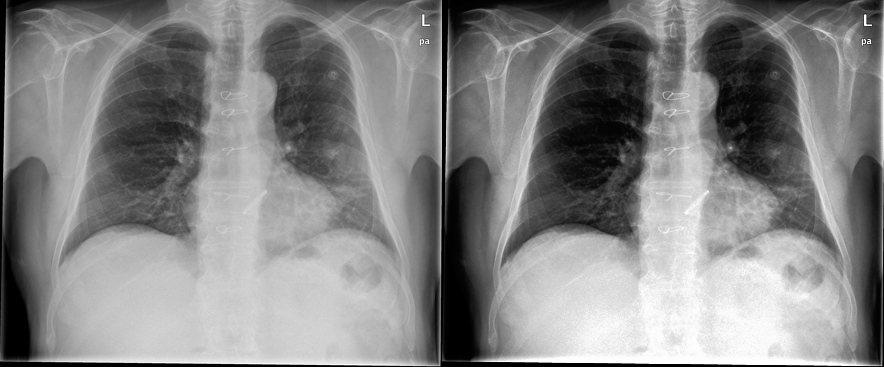

In [18]:
# 히스토그램 균일화
# 밝기 분포를 고르게 만듦

src = cv2.imread('../data/xray.jpg', cv2.IMREAD_GRAYSCALE) # 흑백으로 열기
hist1 = cv2.calcHist([src], [0], mask = None, histSize=[256], ranges=[0, 256])
eqd = cv2.equalizeHist(src)
hist2 = cv2. calcHist([eqd], [0], mask=None, histSize=[256], ranges=[0, 256])
show(np.concatenate([src, eqd], axis=1))

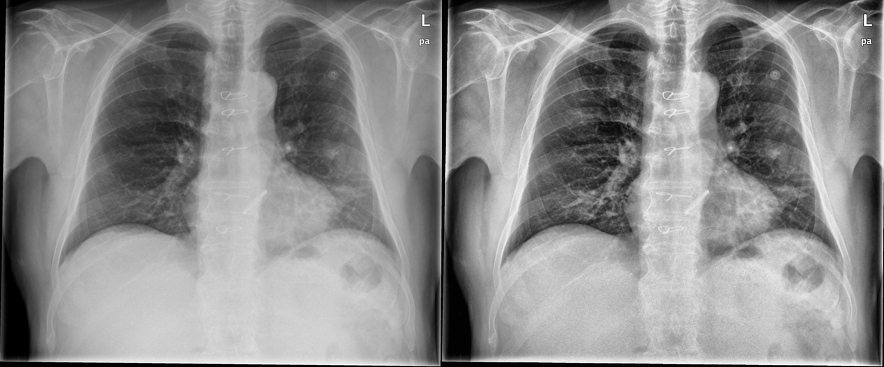

In [19]:
# CLAHE
# 히스토그램 균일화로 이미지가 선명해졌지만,
# 어두운 부분은 너무 어두워지고, 밝은 부분은 너무 밝아져서 디테일이 사라짐
# CLAHE(Contrast Limited Adaptive Histogram Equalization):
# => 그림을 고정된 크기의 타일로 나누어 타일별로 히스토그램 균일화
clahe = cv2.createCLAHE(clipLimit=2.0,        # 밝기 제한 설정. 보통 2.0 ~ 4.0
                        tileGridSize=(8, 8)) # 이미지를 가로 8개, 세로 8개의 타일 -> 64개로 나눔
clahed = clahe.apply(src)

show(np.concatenate([src, clahed], axis=1)) # 갈비뼈가 선명하게 보임

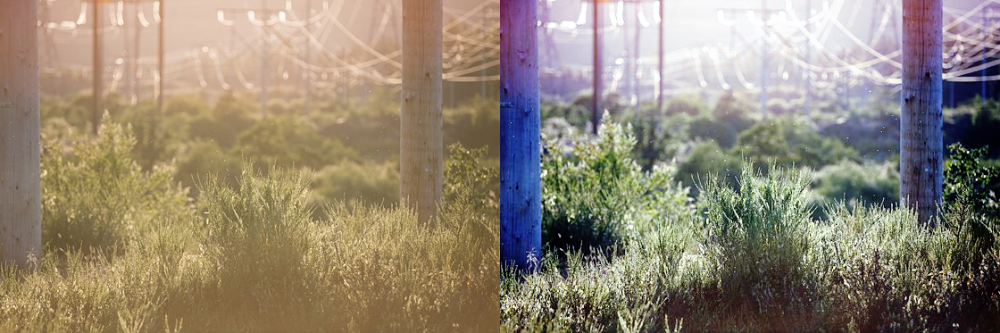

In [20]:
# 컬러 이미지의 히스토그램 균일화
# BGR에서 균일화하면 선명해지기는 하지만, 색상 간의 비율이 달라져서 색상이 바뀜
src = cv2.imread("../data/low.jpg")
b, g, r = cv2.split(src)
be = cv2.equalizeHist(b) # 파랑 균일화
ge = cv2.equalizeHist(g) # 초록 균일화
re = cv2.equalizeHist(r) # 빨강 균일화

eqd1 = cv2.merge((be, ge, re)) # 결합
show(np.concatenate([src, eqd1], axis=1))

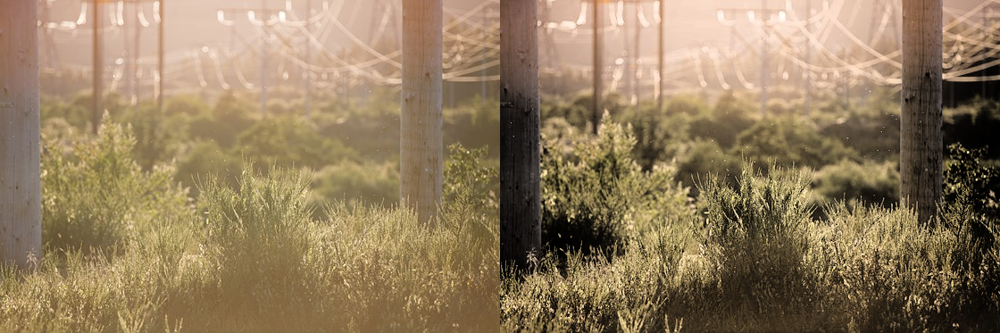

In [21]:
# HSV로 변환 후 히스토그램 균일화
hsv = cv2.cvtColor(src, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv)
eqd_v = cv2.equalizeHist(v) # 밝기만 균일화(어두운 곳은 어둡게, 밝은 곳은 밝게)
mgd = cv2.merge((h, s, eqd_v))
eqd2 = cv2.cvtColor(mgd, cv2.COLOR_HSV2BGR)

show(np.concatenate([src, eqd2], axis=1))

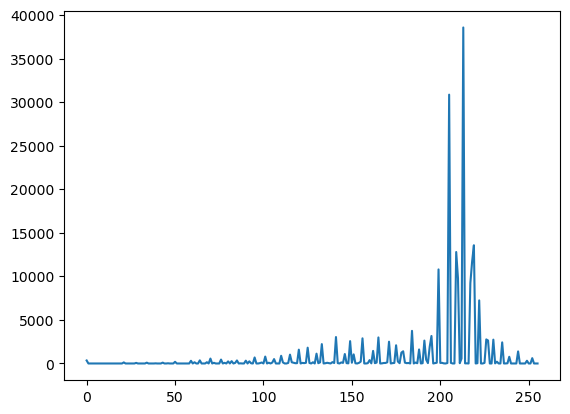

In [22]:
# 히스토그램을 이용한 이진화
# 색상을 흑과 백 2가지만으로 바꾸는 것

src = cv2.imread("../data/newspaper.png", cv2.IMREAD_GRAYSCALE)
hist = cv2.calcHist([src], [0], mask=None, histSize=[256], ranges=[0, 256])

plt.plot(hist)
plt.show()

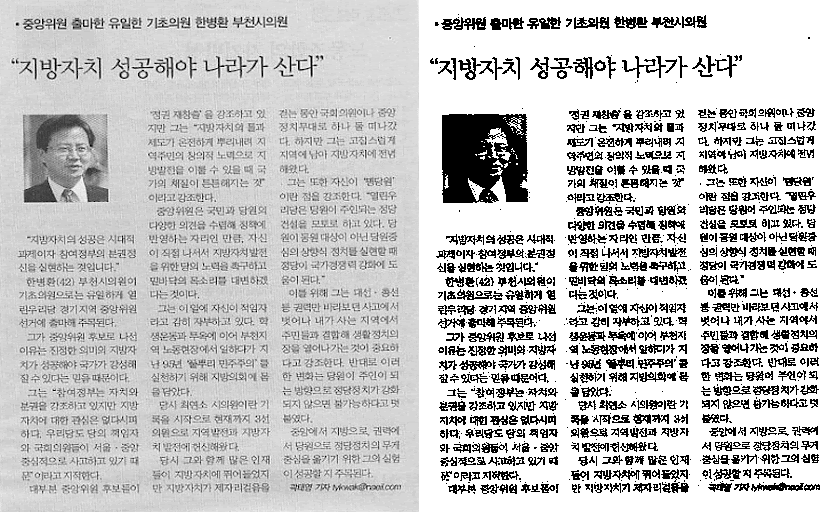

In [23]:
# 190을 문턱값으로 설정해서 0~190 사이는 검은색, 190~255는 흰색으로 이진화
th, bin = cv2.threshold(src, 190, 255, cv2.THRESH_BINARY)
show(np.concatenate([src, bin], axis=1))

169.0


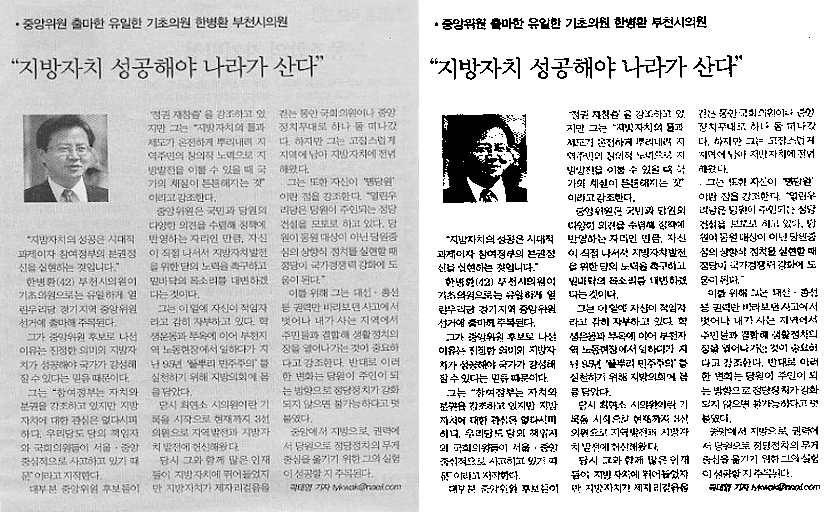

In [24]:
# 오츠의 이진화 알고리즘
# 모든 임계값 중에서 명암 분포가 가장 균일한 것을 자동으로 선택하는 알고리즘
th, bin = cv2.threshold(src, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
print(th)
show(np.concatenate([src, bin], axis=1))

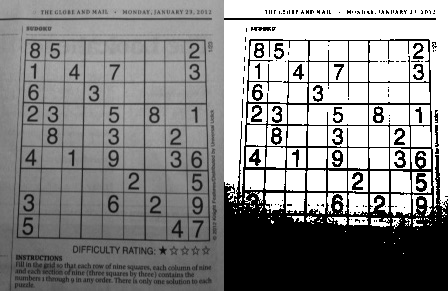

In [25]:
# global thresholding 문제
# 조명이 일정하지 않거나, 배경색이 여러 개이면 하나의 문턱값으로 구분하기 어려움
src = cv2.imread("../data/sudoku.jpg", cv2.IMREAD_GRAYSCALE)
th, bin = cv2.threshold(src, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
show(np.concatenate([src, bin], axis=1))

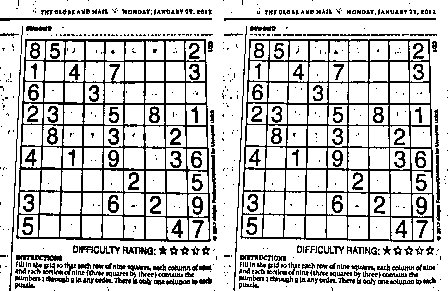

In [26]:
# Adaptive Thresholding
# 이미지를 여러 개의 블록으로 나누어 이진화
block_size = 15 # 주변 15픽셀을 참고
C = 5 # 가감할 상수

# 주변 픽셀의 평균을 이용: 선명하지만 노이즈
adap2 = cv2.adaptiveThreshold(src, 255,
                              cv2.ADAPTIVE_THRESH_MEAN_C,
                              cv2.THRESH_BINARY, block_size, C)

# 가우시안 분포를 이용: 노이즈가 적음
adap3 = cv2.adaptiveThreshold(src, 255,
                              cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                              cv2.THRESH_BINARY, block_size, C)

show(np.concatenate([adap2, adap3], axis=1))

In [27]:
# Look-up Table을 이용한 색 변환
# 픽셀마다 변환할 값을 Look-up Table로 만들어서 계산 절약
src = cv2.imread('../data/balloon.webp')
ones = np.ones(32, dtype=np.uint8)
# 0~31은 0으로, 32~63은 32로, 64~95는 64, ...
lut = np.concatenate((ones*0, ones*32, ones*64, ones*96,
                      ones*128, ones*160, ones*192, ones*224))
lut.shape # 0~255까지의 픽셀값을 어떻게 계산할지 Look-up Table로 만듦

(256,)

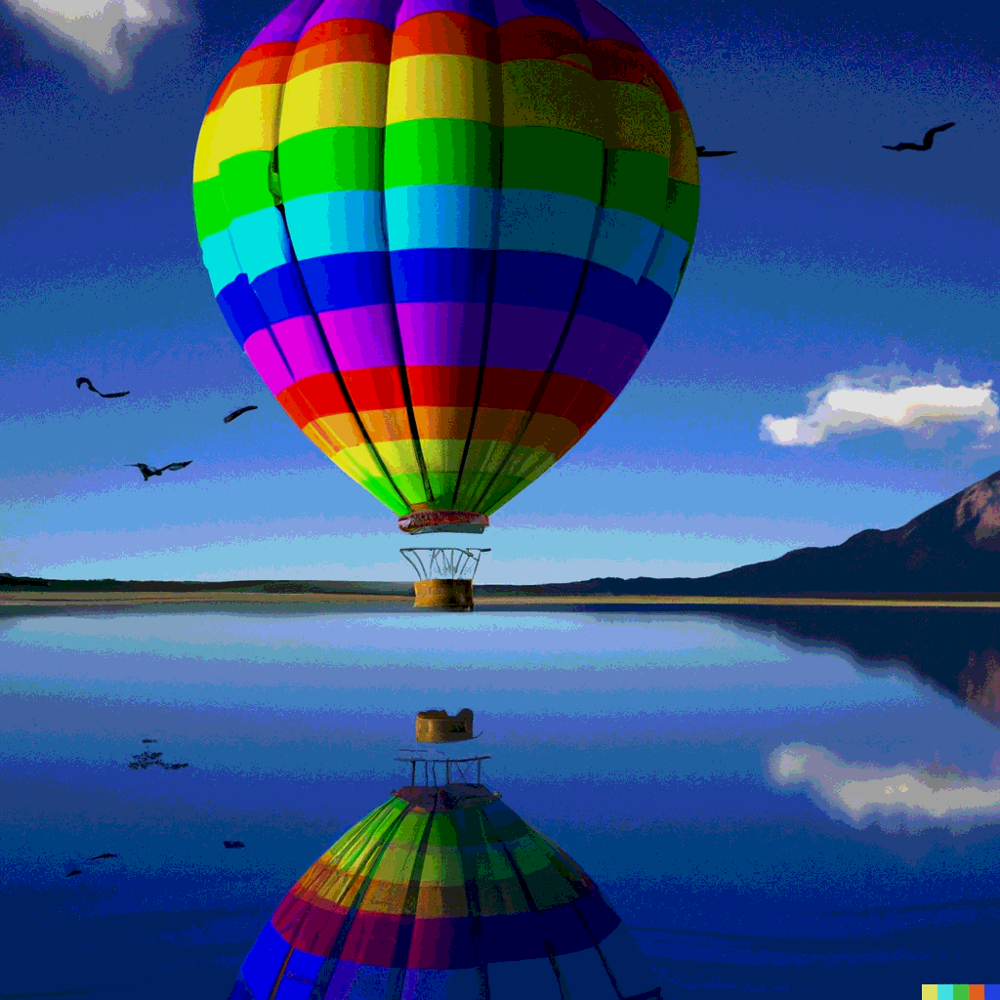

In [29]:
dst=cv2.LUT(src, lut)
show(dst)

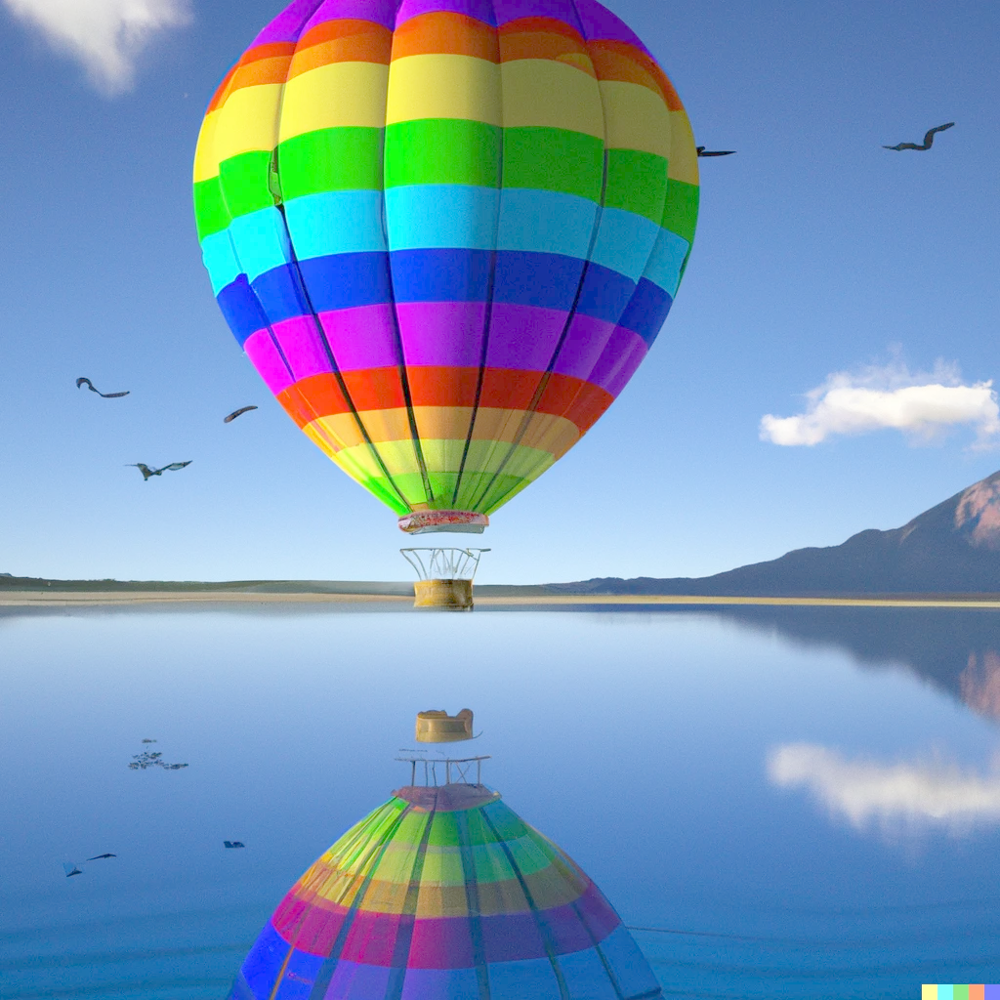

In [30]:
# 감마 보정
# 일괄적으로 밝기 높이기 -> 밝은 부분의 디테일이 뭉개짐
# 감마 함수를 이용하여 밝기를 비선형적으로 보정
# 감마 < 1: 어두운 곳이 더 밝아짐
# 감마 > 1: 밝은 곳이 더 어두워짐

lut = np.zeros(256, dtype=np.uint8)
gamma = 0.5 # 어두운 곳을 밝게

# 보정함수를 미리 계산하여 lut 채우기
for i in range(256):
    lut[i] = np.power(i/255.0, gamma)*255.0

dst = cv2.LUT(src, lut)
show(dst)